# Visuals for Dalton (MU20)

/opt/anaconda3/lib/python3.7/site-packages/sympy/utilities/runtests.py:7: SymPyDeprecationWarning: 

Import sympy.utilities.runtests has been deprecated since SymPy 1.6.
Use Import from sympy.testing.runtests instead. See
https://github.com/sympy/sympy/issues/18095 for more info.

  deprecated_since_version="1.6").warn()


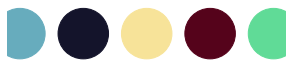

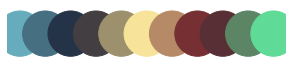

[[0.40531992 0.67547277 0.7394264 ]
 [0.27496508 0.43705679 0.51176303]
 [0.14461024 0.19864081 0.28409967]
 [0.25695625 0.24165973 0.25652518]
 [0.6120031  0.56611353 0.42903958]
 [0.96704995 0.89056733 0.60155398]
 [0.7142229  0.53975035 0.40333549]
 [0.46139585 0.18893336 0.20511701]
 [0.34299121 0.18241353 0.20301802]
 [0.35900898 0.52019085 0.39703853]
 [0.37502675 0.85796817 0.59105903]]


In [2]:
import numpy as np
import scipy

import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d

from matplotlib.patches import Circle, Wedge, Polygon
from matplotlib.collections import PatchCollection
import matplotlib.pyplot as plt


import bubblebox as bb
from braketlab import solid_harmonics as sh

from skimage import measure

from scipy.interpolate import interp1d


# set up colorscheme
colorx = np.random.uniform(0,1,(3,5))



colorx[:,0] = np.array([0.44,0.7,.76])
colorx[:,1] = np.array([0.1,0.1,.2])
colorx[:,2] = np.array([0.97,0.9,.63])
colorx[:,3] = np.array([0.37,0.02,.13])
colorx[:,4] = np.array([0.41,0.87,.62])

colorx = colorx**1.1

#print(colorx)
palette = interp1d(np.linspace(0,1,5), colorx)

plt.figure(figsize =(5,1))
plt.scatter(np.linspace(0,1,5), 0*np.linspace(0,1,5), c = palette(np.linspace(0,1,5)).T, s = 2550)
plt.axis("off")
plt.show()

plt.figure(figsize =(5,1))
plt.scatter(np.linspace(0,1,11), 0*np.linspace(0,1,11), c = palette(np.linspace(0,1,11)).T, s = 2050)
plt.axis("off")
plt.show()

print(palette(np.linspace(0,1,11)).T)

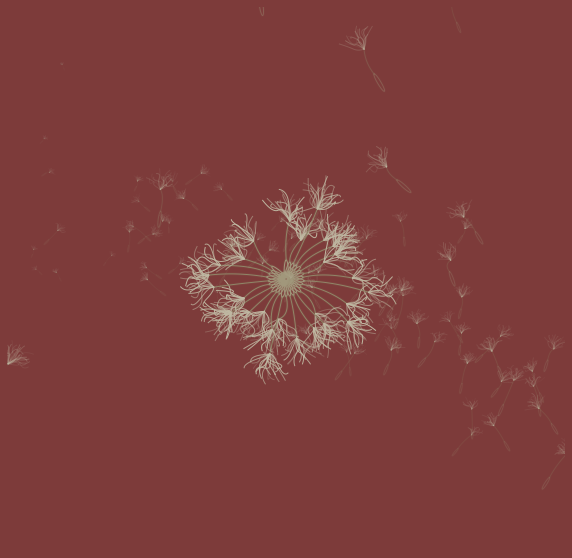

In [4]:
def dandelion(palette):
    
    c1,c2,c3 = palette(np.random.uniform(0,1,3)).T
    plt.rcParams['figure.facecolor'] = c2
    def dseed(rot = None, translate = None, S = 2.0, d = 0, al = 1):

        if rot is None:
            rot = np.array([[1,0],[0,1]])

        if translate is None:
            translate = np.array([0,0])


        seed = np.random.randint(1000)
        #print(seed)

        N = 30
        t = np.linspace(0,2*np.pi,N)
        T = np.linspace(0,2*np.pi,3*N)

        x,y = .05*np.sin(t), .3*np.cos(t)

        #x += .01*np.random.uniform(-1,1, x.shape)
        #y += .01*np.random.uniform(-1,1, y.shape)
        #x[-1] = x[0]*1
        #y[-1] = y[0]*1

        x,y = interp1d(t, np.array([x,y]), 2)(T)

        xx, yy = S*np.dot(rot, np.array([x,y])) + translate[:, None]


        plt.plot(xx,yy, color = c1**.8, linewidth = 1, alpha = 1*al)
        plt.plot(xx,yy, color = c1**.8, linewidth = 3, alpha = .1*al)
        for i in range(d):
            plt.plot(xx,yy, color = c1**.5, alpha = np.random.uniform(.1,.3), linewidth = np.random.uniform(1,4))

        t = np.linspace(0,2*np.pi, 3)

        x,y = interp1d([0,2*np.pi], np.array([[x[-1], y[-1]], [x[-1], y[-1]+np.random.uniform(.5,1.5)]]).T)(t)
        x[2:] += .2*np.random.uniform(-1,1,len(t)-2)
        y[2:] += .2*np.random.uniform(-1,1,len(t)-2)


        x,y = interp1d(t, np.array([x,y]), 2)(T)


        xx, yy = S*np.dot(rot, np.array([x,y])) + translate[:, None]

        plt.plot(xx,yy, color = c1, linewidth = 1,alpha = 1*al)
        plt.plot(xx,yy, color = c1, linewidth = 3, alpha = .1*al)
        for i in range(d):
            plt.plot(xx,yy, color = c1**.5, alpha = np.random.uniform(.1,.3), linewidth = np.random.uniform(1,4))


        x0 = x[-1]
        y0 = y[-1]
        Nn = np.random.randint(10,25)
        th = np.linspace(-np.pi/3, np.pi/3, Nn) + .01*np.random.uniform(-np.pi/2.0,np.pi/2.0, Nn )

        for i in range(Nn):
            r = np.random.uniform(.4,.7)

            x,y = r*np.sin(th[i]) + x0, r*np.cos(th[i]) + y0

            x,y = interp1d([0,2*np.pi], np.array([[x0, y0], [x, y]]).T)(np.linspace(0,2*np.pi,4))
            x[1:] += .1*np.random.uniform(-1,1,3)
            y[1:] += .1*np.random.uniform(-.5,1.5,3)

            x,y = interp1d(np.linspace(0,2*np.pi,4), np.array([x,y]), 2)(T)

            xx, yy = S*np.dot(rot, np.array([x,y])) + translate[:, None]


            plt.plot(xx,yy, color = c1**.5, alpha = np.random.uniform(.2,1)*al, linewidth = 1)

            for i in range(d):
                plt.plot(xx,yy, color = c1**.5, alpha = np.random.uniform(.1,.3), linewidth = np.random.uniform(1,4))









    plt.figure(figsize = (10,10))
    a = 1

    for i in range(27):
        th = i*2*np.pi/30 
        a = np.random.uniform(.3,.5)
        x,y = a*np.sin(th), a*np.cos(th)

        rot = np.array([[np.cos(th), np.sin(th)], [-np.sin(th), np.cos(th)]])
        dseed(rot = rot, translate = np.array([x,y]), S = 3)






    for i in range(10):


        th = np.random.uniform(-1,1)
        t = np.random.uniform(0,2*np.pi)
        r = 30*np.random.uniform(.5,1)**2

        trans = np.array([r*np.cos(t), r*np.sin(t)])


        rot = np.array([[np.cos(th), np.sin(th)], [-np.sin(th), np.cos(th)]])
        s = np.random.uniform(.8,3)
        dseed(rot = rot, translate = trans, S = s, d = 0, al = .4*s/3.0)


    r = np.array([[-20,10,-20],[20,-10,20]])

    r = interp1d([0,1], r.T)(np.linspace(0,1,8))

    r[1:-1] += 5*np.random.uniform(-1,1,r[1:-1].shape)


    t= np.random.uniform(0,1,80)
    r = interp1d(np.linspace(0,1,r.shape[1]), r, 3)(t)

    r[2] -= r[2].min()
    r[2] = r[2]/r[2].max()


    for i in range(r.shape[1]):
        th = np.random.uniform(-1,1)
        rot = np.array([[np.cos(th), np.sin(th)], [-np.sin(th), np.cos(th)]])

        trans = np.array([r[0,i], r[1,i]]) + (2+r[2,i])*2*np.random.uniform(-1,1, 2)
        s = r[2,i] + .2 + np.random.uniform(0,.5)
        dseed(rot = rot, translate = trans, S = s, d = 0, al = .4*s/3.0)





    plt.xlim(-20,20)
    plt.ylim(-20,20)
    plt.axis("off")

    plt.savefig("dandel7.png",facecolor = c2, dpi = 100)

    plt.show()
    
dandelion(palette)

[0.14461024 0.19864081 0.28409967] [0.6120031  0.56611353 0.42903958] [0.40531992 0.67547277 0.7394264 ]


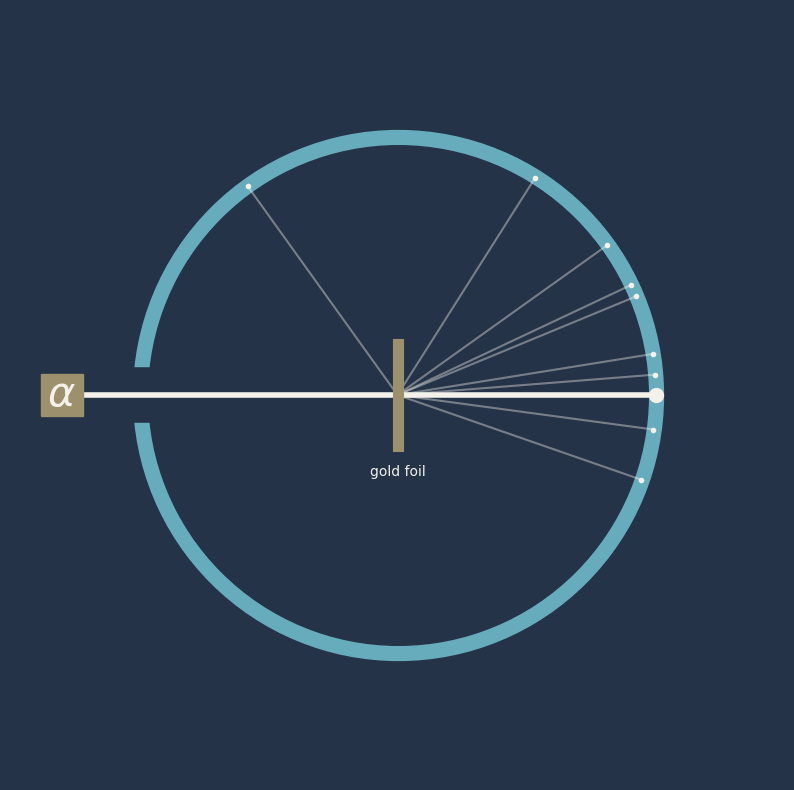

In [3]:
# rutherford figure

def figure_1(c1,c2,c3):
    plt.rcParams['figure.facecolor'] = c1
    
    plt.figure(figsize = (10,10))
    n_beams = 9
    np.random.seed(18)
    for i in range(n_beams):
        th = np.random.normal(0,1.0)
        
        plt.plot([0, np.cos(th)], [0, np.sin(th)], "-", color = c2**.1, zorder = 2, alpha = .4)
        plt.plot([np.cos(th)], [np.sin(th)], "o", color = c2**.1, zorder = 3, markersize = 3)
        
        
    s = 10.9
    plt.plot([0],[0], "o", color = c3, markersize = s*35, zorder = 0)
    plt.plot([0],[0], "o", color = c1, markersize = s*33, zorder = 1)
    
    
    plt.plot([-1.3], [0], "s", color = c2, zorder = 2, markersize = 30)
    plt.text(-1.3,0,"$\\alpha$", color = c2**.1, fontsize = 30, ha = "center", va = "center")
    
    plt.plot([0, -2], [0, 0], "-", color = c1, zorder = 1, linewidth = 40)
    plt.plot([0, -1.3], [0, 0], "-", color = c2**.1, zorder = 1, linewidth = 4)
    plt.plot([0, 1.0], [0, 0], "-", color = c2**.1, zorder = 1, linewidth = 4)
    plt.plot([1], [0], "o", color = c2**.1, zorder = 3, markersize = 10)
    
    plt.plot([0, 0], [-.2, .2], "-", color = c2, zorder = 3, linewidth = 8)
    plt.text(0,-.3,"gold foil", color = c2**.1, fontsize = 10, ha = "center", va = "center")
    
    
    plt.axis("off")
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    plt.savefig("rutherford.png", bbox_inches = "tight", dpi = 500,facecolor=c1**2)
    plt.show()
    
    
c1,c2,c3 = palette([.2,.4,0]).T
#c1 = np.array([1,1,1])
print(c1,c2,c3)
#figure_1(c1,c2,c3)

figure_1(c1,c2,c3)

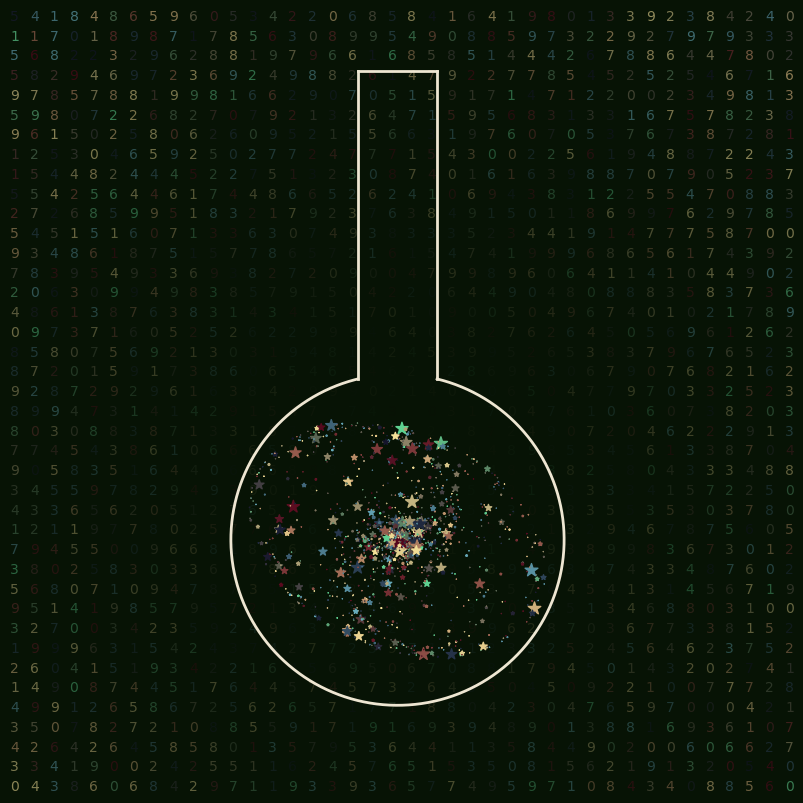

In [4]:
def bottle(palette):
    c1,c2,c3 = palette(np.random.uniform(0,1,3))
    N = 2000



    r = np.exp(-np.random.uniform(0.0,2,N)**2)
    theta = np.random.uniform(0,2*np.pi,N)




    x = r*np.cos(theta)
    y = r*np.sin(theta)*.7


    for i in range(N):
        th = .8*r[i]**2 + np.random.uniform(-.5,.5)
        th = np.pi*np.exp(-2*r[i]**2)
        x[i], y[i] = np.dot( np.array([[np.cos(th), np.sin(th)],[-np.sin(th), np.cos(th)]]), np.array([x[i], y[i]]))

    plt.rcParams['figure.facecolor'] = .5*c2**2
    plt.figure(2, figsize = (10,10))


    #for i in range(N):
    #    for j in range(i+1, N):

    #for d in range(100):
    #    i,j = np.random.randint(0,len(x), 2)
    #    plt.plot([x[i], x[j]], [y[i], y[j]], "-", color = c1, alpha = .5, linewidth = .5)
    #col = np.random.uniform(0,1,(3,3))
    #col[:, 0] = c1
    #col[:, 2] = c2

    #col = interp1d(np.array([0,.5,1]), col.T,2)

    #(np.linspace(0,1,N))
    #col = col - col.min()
    #col = col/col.max()
    #col = col.T[::-1]

    #print(col(np.random.uniform(0,1,N)).shape)

    Nx = 40
    X = np.random.randint(0,10,(Nx,Nx))
    ci,cj = 0,0
    for i in np.linspace(-1,1,Nx):
        for j in np.linspace(-1,1,Nx):
            plt.text(i,j,np.random.randint(0,10), color = palette(np.random.uniform(0,1)), zorder = 0, alpha = 1 - np.exp(-.5*(i**2 + (j+.2)**2)))


    plt.scatter(x*.4,y*.4-.35, marker = "*", c = palette(np.random.uniform(0,1,N)).T, s = 100*np.exp(-np.random.uniform(0,30,N)), alpha = 1)

    Nt = 300
    t = np.linspace(.24,2*np.pi-.24, Nt)

    x,y = .43*np.sin(t), .43*np.cos(t) - .35

    lw = 2
    plt.plot(x,y, color = c1**.1, linewidth = lw)
    plt.plot(np.array([x[-1], x[-1]]),np.array([y[-1], y[-1]+.8]), color = c1**.1, linewidth = lw)

    plt.plot(np.array([x[0], x[0]]),np.array([y[-1], y[-1]+.8]), color = c1**.1, linewidth = lw)

    plt.plot(np.array([x[0], x[-1]]),np.array([y[-1]+.8, y[-1]+.8]), color = c1**.1, linewidth = lw)



    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.axis("off")
    plt.savefig("galaxy_in_a_bottle.png", facecolor = .5*c2**2, dpi = 100, bbox_inches = "tight")
    plt.show()
    
bottle(palette)

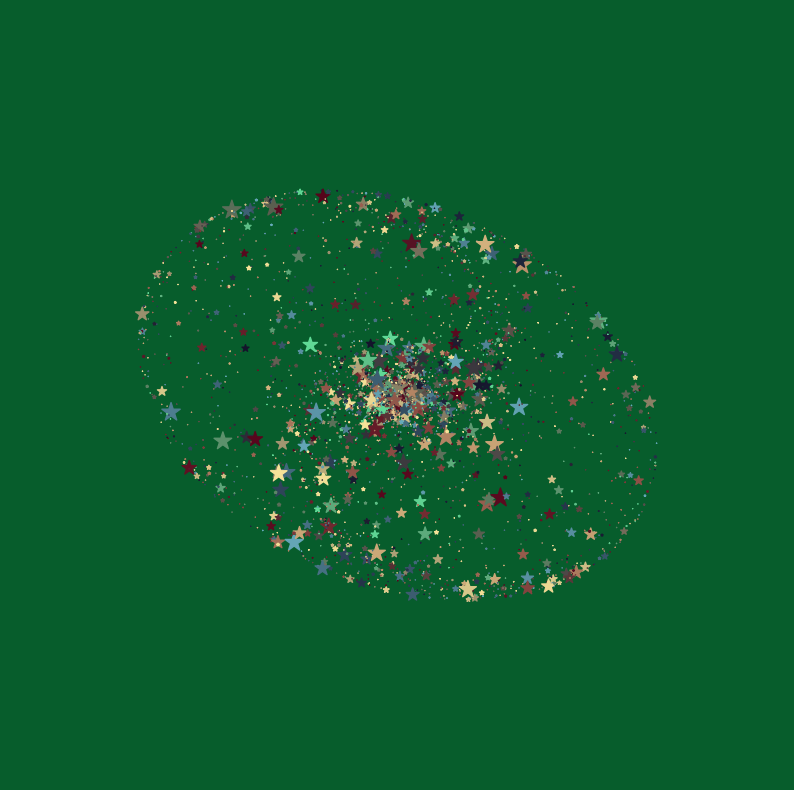

In [8]:
def galaxy(palette):
    c1,c2,c3 = palette(np.random.uniform(0,1,3))
    N = 5000



    r = np.exp(-np.random.uniform(0.0,2,N)**2)
    theta = np.random.uniform(0,2*np.pi,N)




    x = r*np.cos(theta)
    y = r*np.sin(theta)*.7


    for i in range(N):
        th = .8*r[i]**2 + np.random.uniform(-.5,.5)
        th = np.pi*np.exp(-2*r[i]**2)
        x[i], y[i] = np.dot( np.array([[np.cos(th), np.sin(th)],[-np.sin(th), np.cos(th)]]), np.array([x[i], y[i]]))

    plt.rcParams['figure.facecolor'] = .5*c2**2
    plt.figure(2, figsize = (10,10))


    #for i in range(N):
    #    for j in range(i+1, N):

    #for d in range(100):
    #    i,j = np.random.randint(0,len(x), 2)
    #    plt.plot([x[i], x[j]], [y[i], y[j]], "-", color = c1, alpha = .5, linewidth = .5)
    #col = np.random.uniform(0,1,(3,3))
    #col[:, 0] = c1
    #col[:, 2] = c2

    #col = interp1d(np.array([0,.5,1]), col.T,2)

    #(np.linspace(0,1,N))
    #col = col - col.min()
    #col = col/col.max()
    #col = col.T[::-1]

    #print(col(np.random.uniform(0,1,N)).shape)

    Nx = 40
    X = np.random.randint(0,10,(Nx,Nx))
    

    plt.scatter(.7*x,.7*y, marker = "*", c = palette(np.random.uniform(0,1,N)).T, s = 200*np.exp(-np.random.uniform(0,30,N)), alpha = 1)

    Nt = 300
    t = np.linspace(.24,2*np.pi-.24, Nt)

    


    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.axis("off")
    plt.savefig("galaxy.png", facecolor = .5*c2**2, dpi = 100, bbox_inches = "tight")
    plt.show()
    
galaxy(palette)

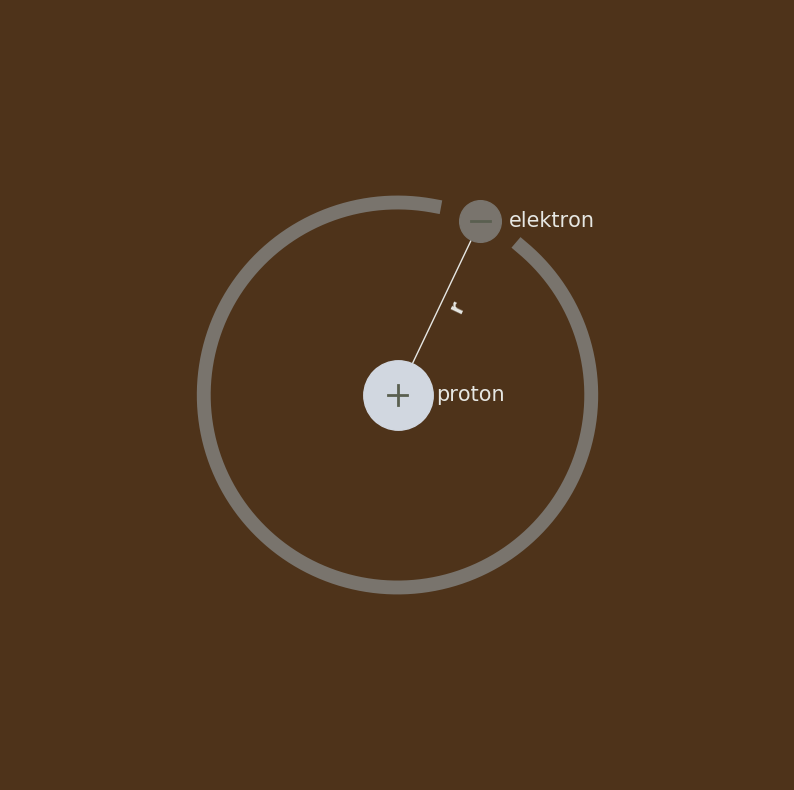

In [9]:
def classical_hydrogen(palette, detailed = True):
    c1,c2,c3 = palette(np.random.uniform(0,1,3)).T
    plt.rcParams['figure.facecolor'] = .5*c2**2
    c2 = c2**.1
    c3 = c3**.1
    
    t = np.linspace(-1,1,500)
    phi0 = 2.7
    
    sp, cp = np.sin(phi0), np.cos(phi0 + np.pi) 
    d = .05
    
    plt.figure(figsize = (10,10))
    dt = .92
    plt.plot(np.sin(dt*np.pi*t - phi0), np.cos(dt*np.pi*t - phi0), "-", color = .5*c2**2, linewidth = 10, zorder = 0, alpha = 1)
    plt.plot([sp],[cp], "o", color = .5*c2**2, markersize = 30,zorder = 0)
    plt.plot([-d,d], [0,0], "-", color = c1, linewidth = 2, zorder = 1)
    plt.plot([0],[0], "o", color = c3, markersize = 50, zorder = 0)
    plt.plot([0,0], [-d,d], "-", color = c1, linewidth = 2,zorder = 1)
    
    plt.plot([sp-d,sp+d], [cp,cp], "-", color = c1, linewidth = 2, zorder = 1)
    
    
    if detailed:
        plt.plot([0,sp], [0, cp], "-", color = c1**.1, zorder = -1, linewidth = 1)
        plt.text(sp/2.0 + .1, cp/2.0, "$\\mathbf{r}$", color = c1**.1, rotation = -90 + 180*phi0/np.pi, ha = "center", va = "center", fontsize = 15)
    
        plt.text(sp + .15, cp, "elektron", color = c1**.1, fontsize = 15, ha = "left", va = "center")
        plt.text(.2,0, "proton", color = c1**.1, fontsize = 15, ha = "left", va = "center")
    plt.axis("off")
    plt.xlim(-2,2)
    plt.ylim(-2,2)
    plt.savefig("hydrogen_classical_5.png",transparent = True, dpi = 500, bbox_inches = "tight", facecolor =.5*c2**2)
    plt.show()
    
classical_hydrogen(palette)

(3, 599)


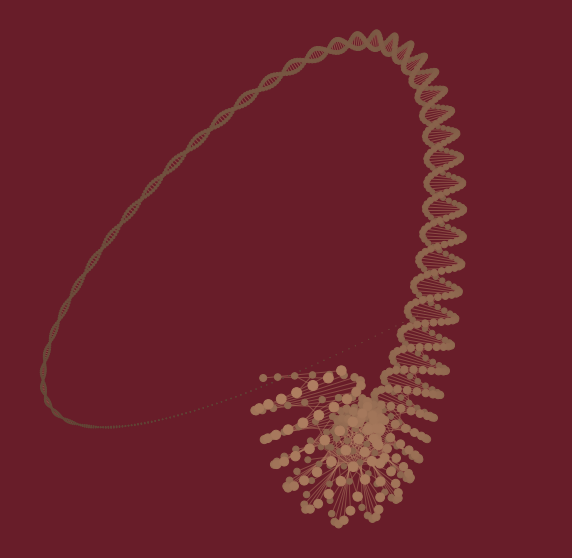

(3, 599)


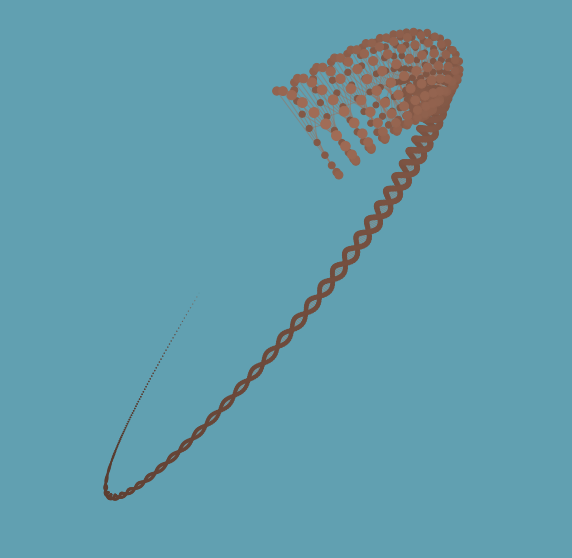

(3, 599)


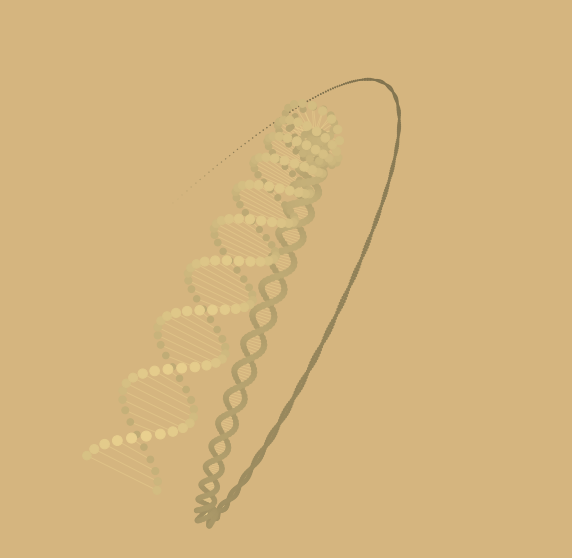

(3, 599)


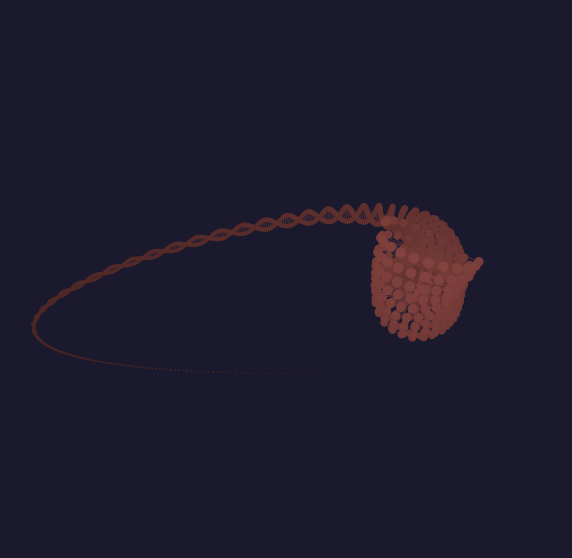

(3, 599)


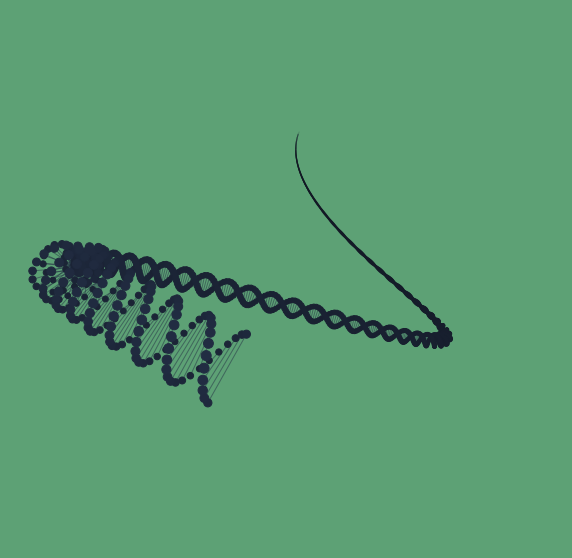

(3, 599)


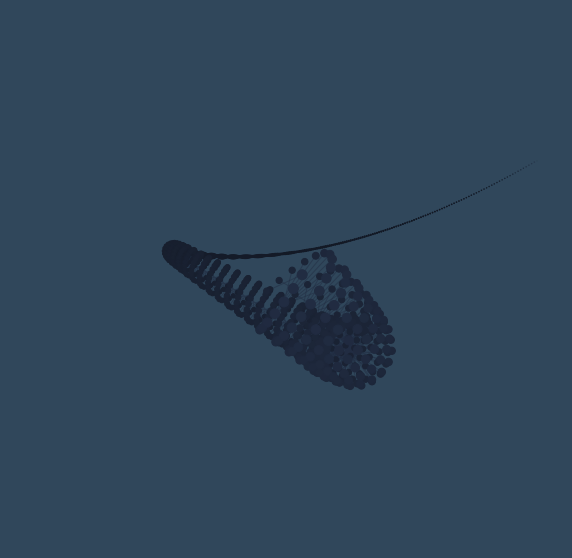

(3, 599)


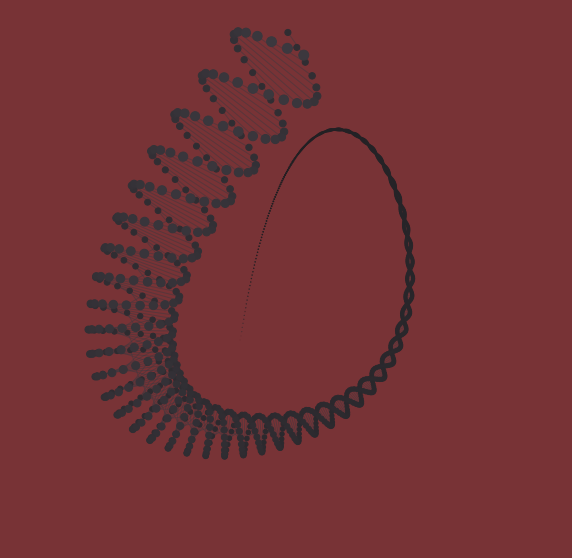

(3, 599)


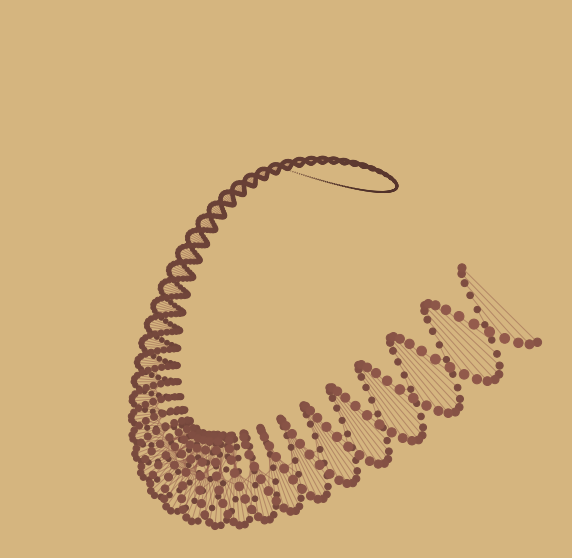

(3, 599)


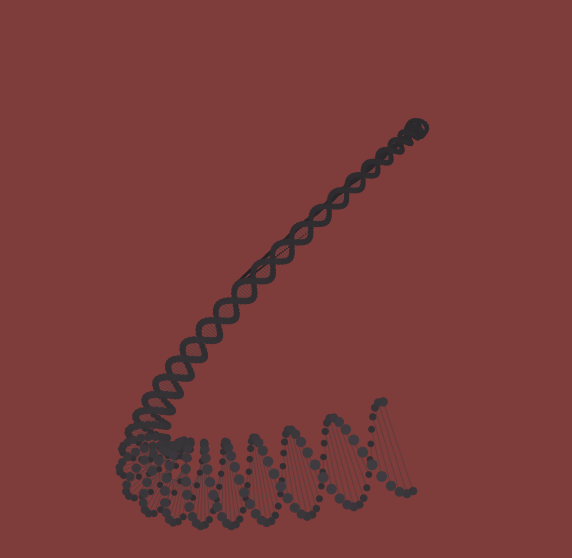

(3, 599)


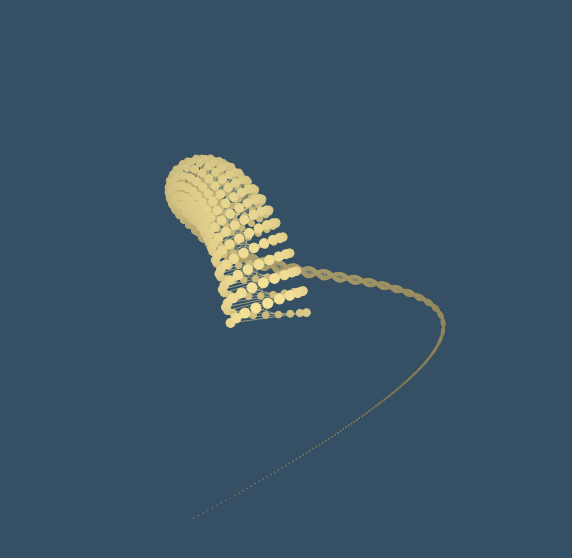

In [3]:
def dna(palette, n = 5, N = 600, NN = 30, seed = 10):
    #n = 5
    #N = 600
    
    np.random.seed(seed)
    r = interp1d(np.linspace(0,1,n), np.random.uniform(-1,1,(3,n)), 3)(np.linspace(0,1,N))

    r[2, :] = np.linspace(0,1,N)


    #r[2] -= r[2].min()
    #r[2] = r[2]/r[2].max()



    d = r[:, 1:] - r[:, :-1]
    d = d/np.sqrt(np.sum(d**2, axis = 0))
    print(d.shape)


    dc = np.cross(r[:, :-1], d, axis = 0)*.1


    #NN = 30

    pts = np.zeros((3, 2*N), dtype = np.float_)
    c = 0 

    rmin = r[2, :].min()
    rmax = (r[2, :] - rmin).max()
    
    c1,c2,c3 = palette(np.random.uniform(0,1,3)).T



    plt.rcParams['figure.facecolor'] = c2 #**2
    plt.figure(figsize = (10,10))

    for i in range(N-1):


        v_ = np.cross(d[:, i], dc[:,i])


        dc[:, i] = np.sin(NN*i*2*np.pi/N)*v_ + np.cos(NN*i*2*np.pi/N)*dc[:,i]

        pts[:, c] =   r[:,i] + dc[:, i] * 2* ((r[2, i] - rmin)/rmax)**2
        pts[:, c+1] = r[:,i] - dc[:, i] * 2* ((r[2, i] - rmin)/rmax)**2

        plt.plot([pts[0, c], pts[0, c+1]],[pts[1, c], pts[1, c+1]], "-", color = c1, 
                 linewidth = 1, alpha = .5, zorder = -2)

        c += 2





    pts[2] -= pts[2].min()
    pts[2] = pts[2]/pts[2].max()


    pts = pts[:, :-2]

    pts = pts[:, np.argsort(pts[2, :])]



    plt.scatter(pts[0], pts[1], s = 100*pts[2]**2, c = c1*(1 + pts[2][:, None])/2.0, zorder = 2)
    #plt.scatter(pts[0], pts[1], s = 20*pts[2]**2, c = c2*(1 + pts[2][:, None])/2.0, zorder = 2, alpha = 1)
    
    
    #plt.scatter(r[0,:-1] + dc[0], r[1, :-1] + dc[1], s = 200*r[2, :-1], c = (1,0,0)*(1 + r[2, :-1][:, None])/2.0)

    #plt.scatter(r[0,:-1] - dc[0], r[1, :-1] - dc[1], s = 200*r[2, :-1], c = (0,1,0)*(1 + r[2, :-1][:, None])/2.0)


    plt.axis("off")


    x_, y_, z_ = np.mean(pts, axis = 1)



    xm_ = np.max(np.abs(pts[0] - x_))
    ym_ = np.max(np.abs(pts[1] - y_))

    dm = np.max([xm_, ym_])
    plt.xlim(x_ - 1.1*dm,x_ + 1.1*dm)
    plt.ylim(y_ - 1.1*dm,y_ + 1.1*dm)
    plt.savefig("dna_%i.png" % seed, facecolor = c2, dpi = 500)
    plt.show()
    

for i in range(10,20):
    dna(palette, seed = i)


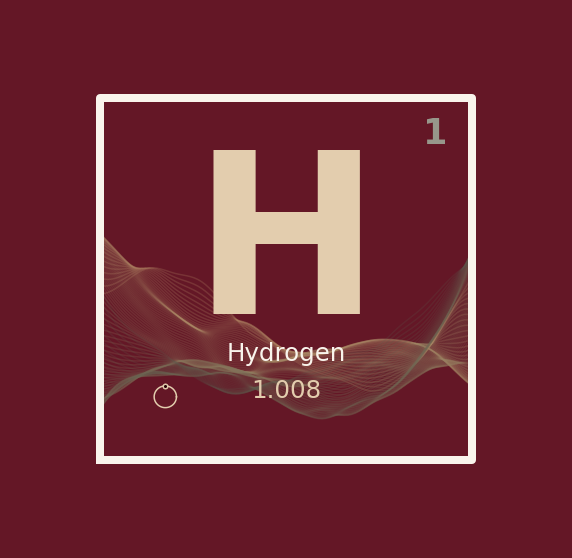

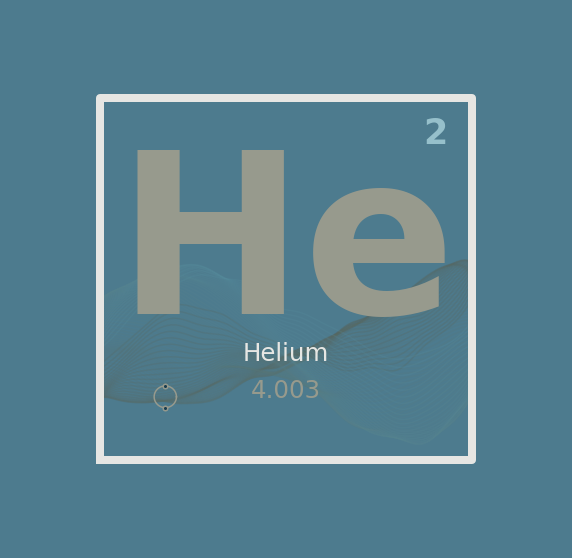

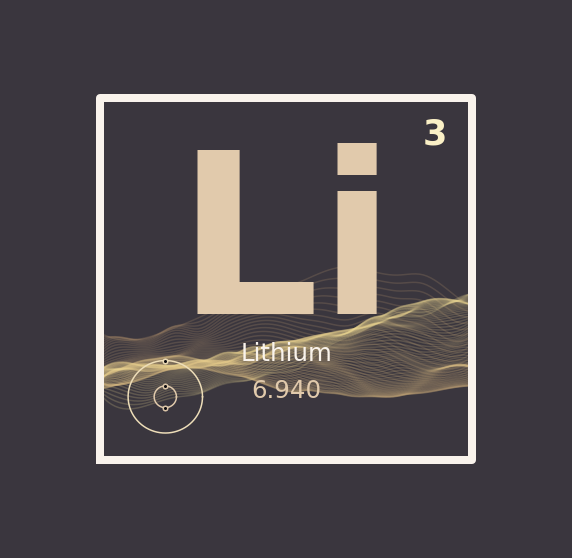

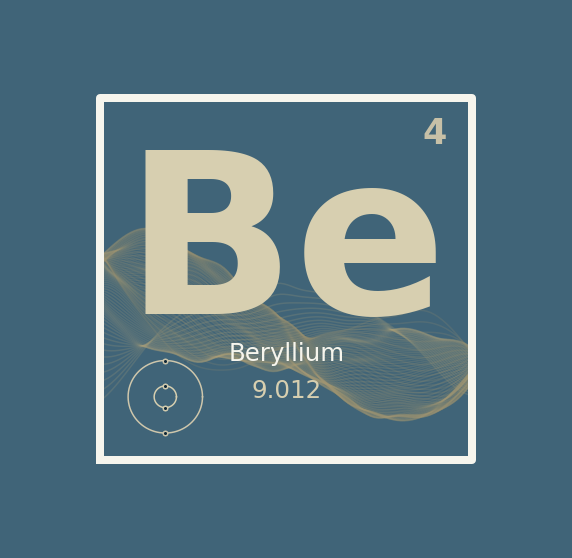

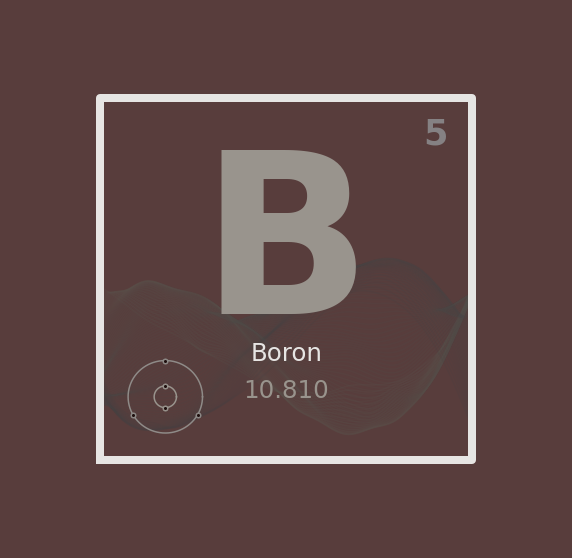

...

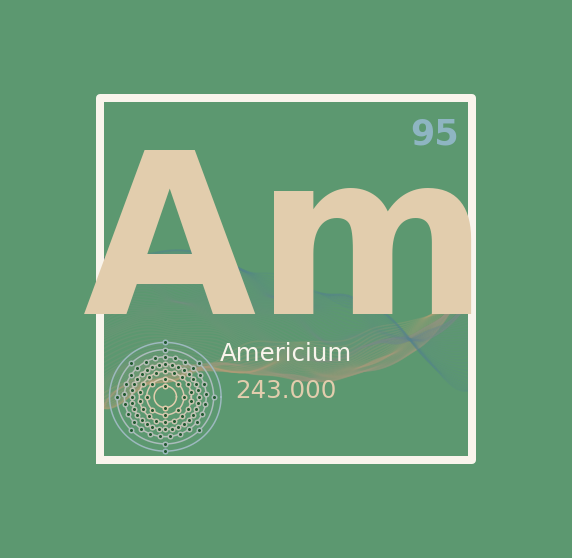

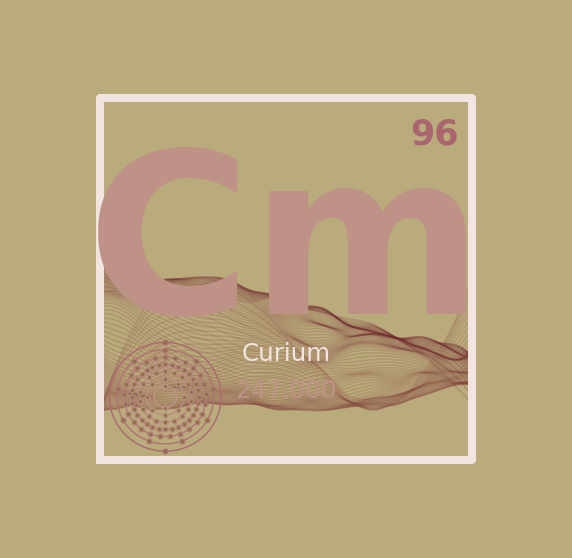

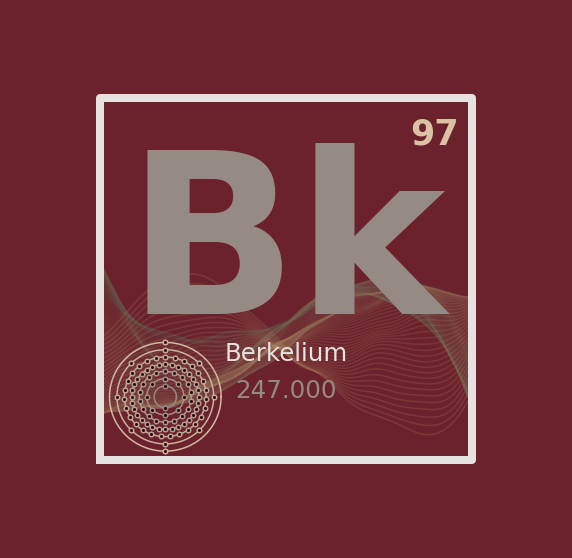

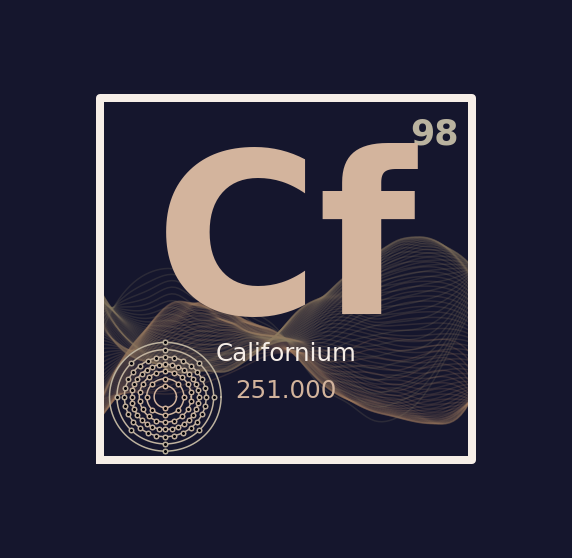

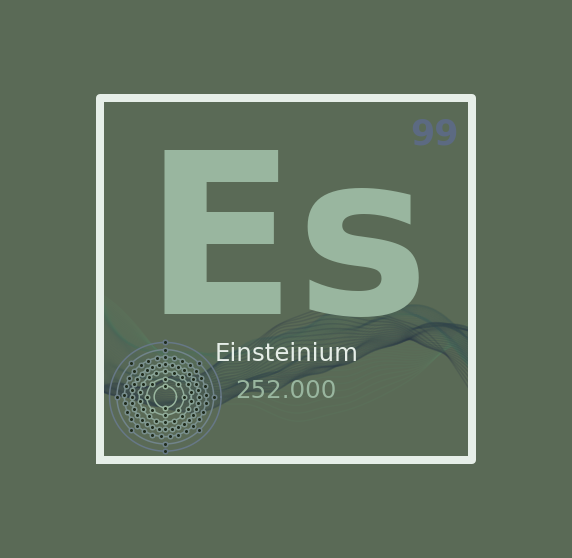

In [5]:
from mendeleev import element

def perlin_2d():
    tt =  np.linspace(0,1,4)
    I = interp2d(tt,tt,np.random.uniform(-1,1,(4,4)))
    for i in np.arange(2,5)**2:
        tt =  np.linspace(0,1,i)
        I = interp2d(tt, tt,I(tt,tt) + np.random.uniform(-1,1,(i,i))/i,  "cubic")
    return I

def element_(palette, el, kk = 0):
    #print("elm = %s" % elm)
    #exec("from mendeleev import %s as el" % elm)
    #print(el)
    el = element(el)
    n1,n2,n3 = np.random.uniform(0,1,3)
    c1,c2,c3 = palette([n1,n2,n3]).T
    
    
    # set up internal colorscheme
    colorx = np.random.uniform(0,1,(3,2))

    colorx[:,0] = c1
    colorx[:,1] = c3

    #print(colorx)
    p2 = interp1d([0,1], colorx)
    
    



    plt.rcParams['figure.facecolor'] = c2
    plt.figure(figsize = (10,10))
    
    
    t = np.linspace(0,1,100)
    I = perlin_2d()(t,t)
    t = np.linspace(-1,1,100)
    for i in range(I.shape[0]):
        plt.plot(t, -.35 + .4*I[i], color = p2(i/I.shape[0]), zorder = -1, alpha = .2)


    plt.plot(np.array([-1,1,1,-1,-1]), np.array([-1,-1,1,1,-1]), "-", linewidth = 8, color = c1**.1)
    
    plt.axis("off")
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    
    t = np.linspace(0,2*np.pi,400)
    x0, y0  = .65, .65
    t0 = .3
    sc = .2
    T0 = 1.4
    ii = 0
    for key in el.ec.electrons_per_shell():
        #print(key)
        cm = p2(ii/len(el.ec.electrons_per_shell()))**.5
        n_elec = el.ec.electrons_per_shell()[key]
        plt.plot(t0*sc*np.cos(t) - x0, t0*sc*np.sin(t) - y0, color = cm)
        T = np.linspace(0,2*np.pi*(n_elec-1)/n_elec, n_elec)
        plt.plot(t0*sc*np.sin(T) - x0, t0*sc*np.cos(T) - y0, "o", zorder = 20, markersize = 5, color = cm)
        plt.plot(t0*sc*np.sin(T) - x0, t0*sc*np.cos(T) - y0, "o", zorder = 20, markersize = 2, color = c2**2)
        t0 += T0/len(el.ec.electrons_per_shell())
        ii+= 1
        

    
    s = .7
    plt.text(.8,.8, el.atomic_number, ha = "center", va = "center", fontsize = s*50, color = c3**.5, fontweight = "bold")
    plt.text(0,-.45, el.symbol, ha = "center", va = "bottom", fontsize = s*320, color = c1**.5, fontweight = "bold")
    plt.text(0,-.35, el.name, ha = "center", va = "top", fontsize = s*35, color = c1**.1)
    plt.text(0,-.55, "%.3f" % el.atomic_weight, ha = "center", va = "top", fontsize = s*35, color = c1**.5)
    #plt.text(0,-.75, el.ec.to_str(), ha = "center", va = "top", fontsize = s*15, color = c3**.5)
    
    plt.savefig("elm_%i.png" % kk, facecolor = c2, dpi = 500)
    plt.show()
    
for i in range(1,100):
    element_(palette, i, i)

In [283]:


perlin_2d()

In [225]:
Si.ec.

TypeError: 'ElectronicConfiguration' object is not subscriptable

In [226]:
from mendeleev.econf import print_spin_occupations

In [228]:
print_spin_occupations(Si.ec)

AttributeError: 'ElectronicConfiguration' object has no attribute 'items'

In [286]:
np.arange(2, 15)**2

array([  4,   9,  16,  25,  36,  49,  64,  81, 100, 121, 144, 169, 196])

In [352]:
pwd

'/Users/audunhansen/visuals/vispy/examples/ipynb'

K
L
M
N
O
P


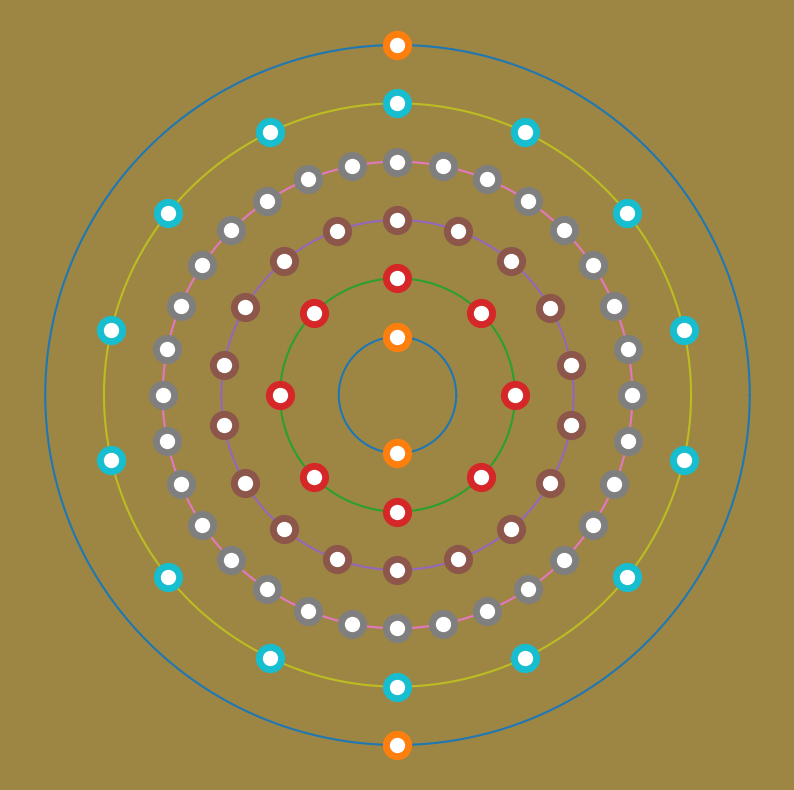

In [398]:
from mendeleev import Os as el
plt.figure(figsize = (10,10))



t = np.linspace(0,2*np.pi,400)
x0, y0  = .5, .5
t0 = 1
sc = 1
for key in el.ec.electrons_per_shell():
    print(key)
    n_elec = el.ec.electrons_per_shell()[key]
    plt.plot(t0*sc*np.cos(t) - x0, t0*sc*np.sin(t) - y0)
    T = np.linspace(0,2*np.pi*(n_elec-1)/n_elec, n_elec)
    plt.plot(t0*sc*np.sin(T) - x0, t0*sc*np.cos(T) - y0, "o", zorder = 20, markersize = 20)
    plt.plot(t0*sc*np.sin(T) - x0, t0*sc*np.cos(T) - y0, "o", zorder = 20, markersize = 10, color = (1,1,1))
    t0 +=1
    plt.axis("off")
    
    #plt.plot()
    
plt.show()
    
    

In [418]:
len(el.ec.electrons_per_shell())

{'K': 2, 'L': 8, 'M': 18, 'N': 32, 'O': 14, 'P': 2}

In [29]:
700*21


14700